## Approach

   1. Use `OWSLib` to determine what data is available and inspect the metadata
   2. Use `OWSLib` to filter and read the data
   3. Use `geopandas` and `folium` to analyze and plot the data

Note that the default examples environment is missing one requirement: `oswlib`. We can `pip install` that before we move on. 

conda install conda-forge::owslib=0.27.2

In [5]:
from owslib.ogcapi.features import Features #conda install conda-forge::owslib
import geopandas as gpd
import pandas as pd
import datetime as dt
from datetime import datetime, timedelta
import numpy as np
import pickle
import warnings

## About the Data


The fire data shown is generated by the FEDs algorithm. The FEDs algorithm tracks fire movement and severity by ingesting observations from the VIIRS thermal sensors on the Suomi NPP and NOAA-20 satellites. This algorithm uses raw VIIRS observations to generate a polygon of the fire, locations of the active fire line, and estimates of fire mean Fire Radiative Power (FRP). The VIIRS sensors overpass at ~1:30 AM and PM local time, and provide estimates of fire evolution ~ every 12 hours. The data produced by this algorithm describe where fires are in space and how fires evolve through time. This CONUS-wide implementation of the FEDs algorithm is based on [Chen et al 2020’s](https://www.nature.com/articles/s41597-022-01343-0) algorithm for California.


The data produced by this algorithm is considered experimental. 

## Look at the data that is available through the OGC API

The datasets that are distributed throught the OGC API are organized into collections.
We can display the collections with the command: 

In [6]:
OGC_URL = "https://firenrt.delta-backend.com"

w = Features(url=OGC_URL)
w.feature_collections()

['public.eis_fire_lf_perimeter_archive',
 'public.eis_fire_lf_newfirepix_archive',
 'public.eis_fire_lf_fireline_archive',
 'public.eis_fire_lf_fireline_nrt',
 'public.eis_fire_snapshot_fireline_nrt',
 'public.eis_fire_snapshot_newfirepix_nrt',
 'public.eis_fire_lf_newfirepix_nrt',
 'public.eis_fire_lf_perimeter_nrt',
 'public.eis_fire_snapshot_perimeter_nrt',
 'public.st_squaregrid',
 'public.st_hexagongrid',
 'public.st_subdivide']

We will focus on the `public.eis_fire_snapshot_fireline_nrt` collection, the `public.eis_fire_snapshot_perimeter_nrt` collection, and the `public.eis_fire_lf_perimeter_archive` collection here. 

### Inspect the metatdata for public.eis_fire_snapshot_perimeter_nrt collection

We can access information that describes the `public.eis_fire_snapshot_perimeter_nrt` table. 

In [7]:
perm = w.collection("public.eis_fire_lf_perimeter_archive")
perm["extent"]

{'spatial': {'bbox': [[-125.01171112060547,
    31.674795150756836,
    -100.99881744384766,
    49.51601791381836]],
  'crs': 'http://www.opengis.net/def/crs/OGC/1.3/CRS84'},
 'temporal': {'interval': [['2018-01-02T12:00:00+00:00',
    '2021-12-31T12:00:00+00:00']],
  'trs': 'http://www.opengis.net/def/uom/ISO-8601/0/Gregorian'}}

In addition to getting metadata about the data we can access the queryable fields. Each of these fields will represent a column in our dataframe.

In [8]:
perm_q = w.collection_queryables("public.eis_fire_lf_perimeter_archive")
perm_q["properties"]

{'wkb_geometry': {'$ref': 'https://geojson.org/schema/Geometry.json'},
 'duration': {'name': 'duration', 'type': 'number'},
 'farea': {'name': 'farea', 'type': 'number'},
 'fireid': {'name': 'fireid', 'type': 'string'},
 'flinelen': {'name': 'flinelen', 'type': 'number'},
 'fperim': {'name': 'fperim', 'type': 'number'},
 'meanfrp': {'name': 'meanfrp', 'type': 'number'},
 'n_newpixels': {'name': 'n_newpixels', 'type': 'number'},
 'n_pixels': {'name': 'n_pixels', 'type': 'number'},
 'ogc_fid': {'name': 'ogc_fid', 'type': 'number'},
 'pixden': {'name': 'pixden', 'type': 'number'},
 't': {'name': 't', 'type': 'string'}}

## Filter the data

In [9]:
start = "2020-06-01T00:00:00+00:00" #June through Nov 2020
end = "2020-12-01T00:00:00+00:00"

Start by finding the largest perimeters in this time period

In [10]:
perm_results = w.collection_items(
    "public.eis_fire_lf_perimeter_archive", 
    bbox=["-125", "31", "-102", "49.2"], #western us [-125,-102,31,49.2] 
    datetime=[start + "/" + end],  
    limit=9999,  # max number of items returned
    filter="farea>25 AND duration>3",  # additional filters based on queryable fields
)

In [ ]:
#variations of search for looking at specific fires
'''
perm_results = w.collection_items(
    "public.eis_fire_lf_perimeter_archive", 
    #bbox=["-121", "46", "-118", "49"], #riverside oregon
    bbox=["-122", "37", "-121", "37.7"], #scu lightning complex
    datetime=[start + "/" + end],  # date range
    limit=2000,  # max number of items returned
    filter="farea>1 AND duration>0",  # additional filters based on queryable fields
)
'''

The result is a dictionary containing all of the data and some summary fields. We can look at the keys to see what all is in there.

In [11]:
perm_results.keys()

dict_keys(['type', 'id', 'title', 'description', 'numberMatched', 'numberReturned', 'links', 'features'])

In [12]:
perm_results['numberMatched'], perm_results["numberReturned"]

(7526, 7526)

The unique ids of the fire objects of interest:

In [13]:
fireids = [i['properties']['fireid'] for i in perm_results['features']]
fireids = np.unique(fireids)
print(len(fireids), 'fire IDs')
fireids = str(tuple(fireids)) #need it as a string list of strings with parentheses for query
print(fireids)

114 fire IDs
('F10029', 'F10203', 'F10385', 'F10416', 'F10523', 'F10547', 'F10554', 'F10620', 'F10719', 'F11059', 'F11161', 'F11225', 'F11247', 'F11292', 'F11330', 'F11390', 'F11391', 'F11393', 'F11394', 'F11402', 'F11440', 'F11445', 'F11458', 'F11467', 'F11493', 'F11527', 'F11529', 'F11549', 'F11567', 'F11572', 'F11597', 'F11598', 'F11604', 'F11632', 'F11656', 'F11692', 'F11693', 'F11716', 'F11765', 'F11801', 'F11811', 'F11825', 'F11878', 'F11921', 'F11974', 'F12021', 'F12089', 'F12211', 'F12244', 'F12259', 'F12330', 'F12380', 'F12391', 'F12498', 'F12649', 'F12657', 'F12721', 'F12731', 'F12741', 'F12774', 'F12785', 'F12811', 'F12822', 'F12889', 'F12953', 'F12961', 'F12981', 'F12984', 'F12986', 'F12987', 'F13057', 'F13066', 'F13132', 'F13201', 'F13203', 'F13273', 'F13304', 'F13346', 'F13430', 'F13515', 'F13687', 'F13692', 'F13944', 'F14128', 'F14147', 'F14725', 'F15118', 'F15195', 'F15360', 'F16605', 'F17534', 'F7046', 'F7672', 'F7807', 'F7810', 'F7814', 'F7823', 'F7850', 'F7851', 'F79

Redo search for these 114 large fires, grabbing all associated perimeters and time stamps so that we get an accurate start date for them

In [14]:
perm_results = w.collection_items(
    "public.eis_fire_lf_perimeter_archive", 
    limit=9999, 
    filter="fireid IN " + fireids, 
)

You can also access the data directly in the browser or in an HTTP GET call using the constructed link.

In [15]:
perm_results["links"][1]["href"]

'https://firenrt.delta-backend.com/collections/public.eis_fire_lf_perimeter_archive/items?limit=9999&filter=fireid+IN+%28%27F10029%27%2C+%27F10203%27%2C+%27F10385%27%2C+%27F10416%27%2C+%27F10523%27%2C+%27F10547%27%2C+%27F10554%27%2C+%27F10620%27%2C+%27F10719%27%2C+%27F11059%27%2C+%27F11161%27%2C+%27F11225%27%2C+%27F11247%27%2C+%27F11292%27%2C+%27F11330%27%2C+%27F11390%27%2C+%27F11391%27%2C+%27F11393%27%2C+%27F11394%27%2C+%27F11402%27%2C+%27F11440%27%2C+%27F11445%27%2C+%27F11458%27%2C+%27F11467%27%2C+%27F11493%27%2C+%27F11527%27%2C+%27F11529%27%2C+%27F11549%27%2C+%27F11567%27%2C+%27F11572%27%2C+%27F11597%27%2C+%27F11598%27%2C+%27F11604%27%2C+%27F11632%27%2C+%27F11656%27%2C+%27F11692%27%2C+%27F11693%27%2C+%27F11716%27%2C+%27F11765%27%2C+%27F11801%27%2C+%27F11811%27%2C+%27F11825%27%2C+%27F11878%27%2C+%27F11921%27%2C+%27F11974%27%2C+%27F12021%27%2C+%27F12089%27%2C+%27F12211%27%2C+%27F12244%27%2C+%27F12259%27%2C+%27F12330%27%2C+%27F12380%27%2C+%27F12391%27%2C+%27F12498%27%2C+%27F12649%27%2C

In [16]:
perm_results['numberMatched'], perm_results["numberReturned"]

(9527, 9527)

## Read data

In addition to all the summary fields, the `perm_results` dict contains all the data. We can pass the data into geopandas to make it easier to interact with.

In [17]:
df = gpd.GeoDataFrame.from_features(perm_results["features"])
df

,geometry,duration,farea,fireid,flinelen,fperim,meanfrp,n_newpixels,n_pixels,ogc_fid,pixden,t
0,"POLYGON ((-102.72753 32.08301, -102.72753 32.0...",7.0,21.698325,F11716,0.000000,23.513195,0.000000,0,17,6206,0.783471,2018-09-09T00:00:00
1,"POLYGON ((-102.72753 32.08301, -102.72753 32.0...",7.0,21.698325,F11716,0.000000,23.513195,0.000000,0,17,6207,0.783471,2018-09-26T00:00:00
2,"POLYGON ((-102.72753 32.08301, -102.72753 32.0...",7.0,21.698325,F11716,0.000000,23.513195,0.000000,0,17,6208,0.783471,2018-09-24T00:00:00
3,"POLYGON ((-102.72753 32.08301, -102.72753 32.0...",7.0,21.698325,F11716,0.000000,23.513195,0.000000,0,17,6209,0.783471,2018-09-09T12:00:00
4,"POLYGON ((-102.72753 32.08301, -102.72753 32.0...",7.0,21.698325,F11716,0.000000,23.513195,0.000000,0,17,6210,0.783471,2018-09-16T12:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
9522,"POLYGON ((-118.55722 34.67110, -118.55713 34.6...",2.0,45.529712,F11225,5.034256,36.210448,2.695385,13,246,123002,5.403065,2020-08-15T00:00:00
9523,"POLYGON ((-118.55729 34.67095, -118.55722 34.6...",1.5,44.248329,F11225,12.783855,35.445570,158.997632,76,233,123003,5.265736,2020-08-14T12:00:00
9524,"POLYGON ((-118.55739 34.67064, -118.55735 34.6...",0.0,32.426566,F11225,31.104472,32.365647,5.930076,132,132,123004,4.070736,2020-08-13T00:00:00
9525,"POLYGON ((-118.55735 34.67080, -118.55729 34.6...",0.5,34.078122,F11225,0.000000,32.305574,0.000000,0,157,123005,4.607061,2020-08-14T00:00:00


Keep only the largest perimeter of each fire ID, keeping track of start and end dates

In [18]:
warnings.filterwarnings('ignore', category=FutureWarning)

large_fires = gpd.GeoDataFrame(columns=list(df.columns) + ['startdate','enddate'])

fids = np.unique(df.fireid)
for fid in fids:
    subset = df[df.fireid==fid]
    startdate = subset.t.min()
    enddate = subset.t.max()

    row = subset.sort_values('farea', ascending=False).iloc[0,:]
    row['startdate'] = startdate
    row['enddate'] = enddate
    
    large_fires = pd.concat([large_fires, pd.DataFrame(row).T]) #depending on gpd version can also use large_fires.append(row)

large_fires = large_fires[['geometry','farea','fireid','startdate','enddate']] #only need these columns
large_fires = gpd.GeoDataFrame(large_fires).set_index('fireid')
large_fires

,geometry,farea,startdate,enddate
fireid,,,,
F10029,"MULTIPOLYGON (((-121.42272 41.69268, -121.4268...",187.358295,2020-07-22T12:00:00,2020-08-20T12:00:00
F10203,"MULTIPOLYGON (((-102.60075 47.71076, -102.6007...",56.976316,2020-07-26T00:00:00,2020-12-31T12:00:00
F10385,"MULTIPOLYGON (((-114.56637 37.39583, -114.5663...",37.553327,2020-07-29T12:00:00,2020-08-22T00:00:00
F10416,"POLYGON ((-112.09950 36.99254, -112.09947 36.9...",43.691927,2020-07-30T00:00:00,2020-08-23T12:00:00
F10523,"POLYGON ((-123.56713 41.18638, -123.56712 41.1...",659.981627,2020-07-31T12:00:00,2020-11-25T12:00:00
...,...,...,...,...
F9578,"POLYGON ((-114.08172 37.92219, -114.08157 37.9...",57.713586,2020-07-13T12:00:00,2021-07-13T12:00:00
F9634,"POLYGON ((-120.51018 36.14962, -120.51000 36.1...",118.363033,2020-07-14T00:00:00,2020-08-09T12:00:00
F9772,"POLYGON ((-112.57715 36.35790, -112.57712 36.3...",29.686967,2020-07-17T00:00:00,2020-08-09T12:00:00


## Explore data

We can quickly explore the data by setting the coordinate reference system (`crs`) and using `.explore()`

In [19]:
large_fires.set_crs("EPSG:4326").explore()

Alternatively we can use lonboard for fast visualization. 
May need to pip install anywidget==0.9.4 in the base environment from which Jupyter launches (and the working environment if necessary) each time the workspace restarts. Refresh browser.

In [20]:
from lonboard import viz, Map, ScatterplotLayer
from lonboard.colormap import apply_continuous_cmap

In [21]:
viz(large_fires.set_crs("EPSG:4326"))

Map(basemap_style=<CartoBasemap.DarkMatter: 'https://basemaps.cartocdn.com/gl/dark-matter-gl-style/style.json'…

Make several manual adjustments to remove duplicate pre-merged fires or non-wildfires

In [22]:
#Removing duplicate pre-merged Oregon fire and others

large_fires = large_fires.drop(['F12380','F13203','F11693','F11597','F11801','F11765',
                               'F11692','F11394','F13273'])
large_fires = large_fires.drop('F7977') #mexico
large_fires = large_fires.drop(['F17534','F16605','F9423','F13346','F14725','F10203','F13692','F13304']) #non-wildfires in NM/ND

In [23]:
#merging 2 Colorado fires
merger = large_fires.loc[['F13515','F11247']]
merger

,geometry,farea,startdate,enddate
fireid,,,,
F13515,"MULTIPOLYGON (((-105.69394 40.76722, -105.6939...",591.899234,2020-09-14T12:00:00,2020-11-13T12:00:00
F11247,"POLYGON ((-105.89877 40.61373, -105.89869 40.6...",444.864376,2020-08-13T12:00:00,2020-09-27T12:00:00


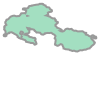

In [24]:
merged = merger.unary_union
merged

In [25]:
#area of new merged polygon
from pyproj import Geod
geod = Geod(ellps="WGS84")
area = abs(geod.geometry_area_perimeter(merged)[0]) / 1000/1000
area

962.8411692189668

In [26]:
large_fires.loc['F13515','geometry'] = merger.unary_union
large_fires.loc['F13515','farea'] = area
large_fires.loc['F13515','startdate'] = merger.startdate.min()
large_fires.loc['F13515','enddate'] = merger.enddate.max()
large_fires = large_fires.drop('F11247')
large_fires = large_fires.sort_values('farea', ascending=False)
#large_fires = large_fires.iloc[:20,:]
large_fires

,geometry,farea,startdate,enddate
fireid,,,,
F11445,"POLYGON ((-122.59844 39.56282, -122.59844 39.5...",4493.471804,2020-08-17T00:00:00,2020-11-25T00:00:00
F11440,"MULTIPOLYGON (((-121.52187 44.78768, -121.5218...",1894.388484,2020-08-17T00:00:00,2020-10-29T12:00:00
F12649,"POLYGON ((-119.48839 37.37486, -119.48839 37.3...",1768.278704,2020-09-05T00:00:00,2020-11-26T00:00:00
F11393,"POLYGON ((-121.37461 37.38389, -121.37456 37.3...",1526.05485,2020-08-16T12:00:00,2020-09-27T12:00:00
F11527,"POLYGON ((-120.85137 39.92894, -120.85124 39.9...",1400.56092,2020-08-18T00:00:00,2020-10-29T12:00:00
...,...,...,...,...
F11467,"POLYGON ((-121.62968 44.45882, -121.62969 44.4...",28.359213,2020-08-17T00:00:00,2020-09-15T12:00:00
F11974,"POLYGON ((-110.69540 33.85455, -110.69522 33.8...",28.043662,2020-08-23T00:00:00,2020-09-16T12:00:00
F8915,"POLYGON ((-112.20849 39.45123, -112.20861 39.4...",27.390576,2020-06-29T12:00:00,2020-07-24T00:00:00


In [27]:
len(large_fires)

95

In [28]:
large_fires.set_crs("EPSG:4326").explore()

## (Optional) Match to MTBS fire event names for top 20

Notes:
<ul>
  <li>Difficult to query MTBS map server, more elegant solution probably exists</li>
    <li>Current solution is slow and runs a separate query for each FEDS fire</li>
  <li>"75" in the URL corresponds to year 2020. Increment by 2 for other years: https://apps.fs.usda.gov/arcx/rest/services/EDW/EDW_MTBS_01/MapServer/WMSServer/</li>
    <li>NIFC is another option: https://data-nifc.opendata.arcgis.com/datasets/nifc::wfigs-interagency-fire-perimeters/api (see MASTER script 7)</li>
</ul> 

In [ ]:
for i in large_fires.iloc[:20,:].index:
    print('searching fire', i)
    xmin,ymin,xmax,ymax = large_fires.geometry[i].bounds
    url = f'https://apps.fs.usda.gov/arcx/rest/services/EDW/EDW_MTBS_01/MapServer/75/query?where=ACRES>100000&geometry=%28{xmin}%2C+{ymin}%2C+{xmax}%2C+{ymax}%29&f=geojson'
    df = gpd.read_file(url)
    if len(df)==0:
        large_fires.loc[i, 'name']='none'
    elif len(df) == 1:
        large_fires.loc[i, 'name'] = df.loc[0,'FIRE_NAME']
    else: #more than one match:
        best_match = large_fires.geometry[i].intersection(df.geometry).area.idxmax()
        large_fires.loc[i, 'name'] = df.loc[best_match,'FIRE_NAME']

searching fire F11445
searching fire F11440
searching fire F12649
searching fire F11393
searching fire F11527
searching fire F11529
searching fire F12774
searching fire F13515
searching fire F11825
searching fire F12981
searching fire F13687
searching fire F15118
searching fire F8251
searching fire F13066
searching fire F10523
searching fire F12961
searching fire F12984
searching fire F10547
searching fire F12731
searching fire F11716


In [39]:
large_fires.name[:21]

fireid
F11445           AUGUST COMPLEX
F11440                LIONSHEAD
F12649                    CREEK
F11393    SCU LIGHTNING COMPLEX
F11527            NORTH COMPLEX
F11529                HENNESSEY
F12774             COLD SPRINGS
F13515             CAMERON PEAK
F11825                   CASTLE
F12981             HOLIDAY FARM
F13687                   MULLEN
F15118         EAST TROUBLESOME
F8251                      BUSH
F13066                   SLATER
F10523       RED SALMON COMPLEX
F12961                RIVERSIDE
F12984             ARCHIE CREEK
F10547               PINE GULCH
F12731                   BOBCAT
F11716                    DOLAN
F7823                       NaN
Name: name, dtype: object

## Add 2km buffer

In [40]:
large_fires_buffered = large_fires.copy()
large_fires_buffered['geometry'] = large_fires.buffer(0.02)
large_fires_buffered.set_crs("EPSG:4326").explore()

## Export to geojson

In [41]:
large_fires.to_file('/projects/my-public-bucket/2020_feds_large_fires95.geojson', driver="GeoJSON")  
large_fires_buffered.to_file('/projects/my-public-bucket/2020_feds_large_fires95_buffered.geojson', driver="GeoJSON")  